In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

sns.set_style('whitegrid')
sns.set_palette('icefire')

### Read data

In [2]:
data_dir = '../data/raw'
train = pd.read_csv(f'{data_dir}/train.csv', header = None, sep = ';')
train.columns = ['clip_id', 'gesture', 'label']
val = pd.read_csv(f'{data_dir}/val.csv', header = None, sep = ';') 
val.columns = ['clip_id', 'gesture', 'label']
print(f'Samples in train dataset: {len(train)}')
print(f'Samples in val dataset: {len(val)}')

Samples in train dataset: 663
Samples in val dataset: 100


In [3]:
# combine train and valid datasets
train['kind'] = 'train'
val['kind'] = 'val'
df = pd.concat([train, val], axis = 0)
df.reset_index(inplace = True, drop = True)
df.shape

(763, 4)

### Understanding label distribution

In [4]:
df[['kind', 'gesture', 'label']].drop_duplicates()\
    .reset_index(drop = True)

,kind,gesture,label
0,train,Left_Swipe_new,0
1,train,Right_Swipe_new,1
2,train,Stop_new,2
3,train,Thumbs_Down_new,3
4,train,Thumbs_Up_new,4
5,train,Left Swipe_new_Left Swipe_new,0
6,train,Right Swipe_new,1
7,train,Stop Gesture_new,2
8,train,Thumbs Down_new,3
9,train,Thumbs Up_new,4


In [5]:
### fix inconsistancy
fix_map = {
    'Left Swipe_new_Left Swipe_new' : 'Left_Swipe_new', # Seems duplication and also the label for both the descriptions is same
    'Stop Gesture_new' : 'Stop_new'                     # fix; becasue the label for both is same (2)
}
for s,r in fix_map.items():
    df['gesture'] = df['gesture'].replace(s, r) 
df['gesture'] = df['gesture'].apply(lambda x: x.replace(' ', '_'))

In [6]:
df[['gesture', 'label']].drop_duplicates()

,gesture,label
0,Left_Swipe_new,0
96,Right_Swipe_new,1
199,Stop_new,2
292,Thumbs_Down_new,3
392,Thumbs_Up_new,4


In [7]:
agg_df = df.groupby(by = ['kind', 'gesture'])['label'].count().reset_index()\
    .sort_values(by = ['gesture', 'label'], ascending = False)
agg_df.rename(columns = {'label' : 'count'}, inplace = True)
agg_df.loc[agg_df['kind'] == 'train', 'pct_count'] = agg_df.loc[agg_df['kind'] == 'train', 'count'] / len(train)
agg_df.loc[agg_df['kind'] == 'val', 'pct_count']   = agg_df.loc[agg_df['kind'] == 'val', 'count'] / len(val)
agg_df['pct_count'] = agg_df['pct_count'] * 100
round(agg_df, 2)

,kind,gesture,count,pct_count
4,train,Thumbs_Up_new,123,18.55
9,val,Thumbs_Up_new,16,16.00
3,train,Thumbs_Down_new,137,20.66
8,val,Thumbs_Down_new,21,21.00
2,train,Stop_new,130,19.61
7,val,Stop_new,22,22.00
1,train,Right_Swipe_new,137,20.66
6,val,Right_Swipe_new,23,23.00
0,train,Left_Swipe_new,136,20.51
5,val,Left_Swipe_new,18,18.00


In [8]:
order = agg_df[agg_df['kind'] == 'train'].sort_values(by = ['count'], ascending = False)['gesture'].drop_duplicates().values

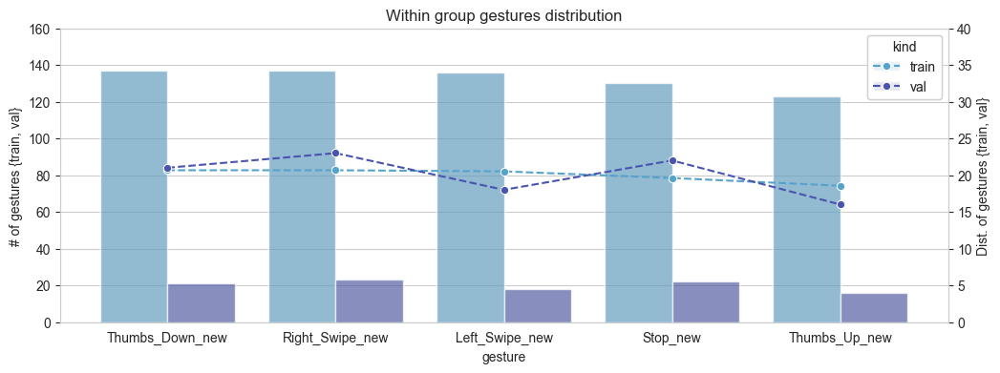

In [9]:
fig, ax = plt.subplots(1, 1, figsize = (12, 4))
sns.barplot(data = agg_df, x = 'gesture', y = 'count', hue = 'kind', alpha = 0.7, ax = ax, order = order)
ax.set_ylim([0, 160])
ax.set_ylabel('# of gestures {train, val}')
ax1 = ax.twinx()
sns.lineplot(data = agg_df, x = 'gesture', y = 'pct_count', hue = 'kind', linestyle = '--', marker = 'o', ax = ax1)
ax1.grid(None)
ax1.set_ylim([0, 40])
ax1.set_ylabel('Dist. of gestures {train, val}')
plt.title('Within group gestures distribution')
plt.show()

Distribution of labels in both the datasets are imbalanced with fewer stop gesture in comparision. However, the imbalance is fairly consistent between them.

### Investigate frames in each clip

In [10]:
df['num_frames'] = df.apply(lambda r: len(os.listdir(os.path.join(data_dir, r['kind'], r['clip_id']))), axis = 1)
df.head(2)

,clip_id,gesture,label,kind,num_frames
0,WIN_20180925_17_08_43_Pro_Left_Swipe_new,Left_Swipe_new,0,train,30
1,WIN_20180925_17_18_28_Pro_Left_Swipe_new,Left_Swipe_new,0,train,30


In [11]:
df.groupby(by = ['kind'])['num_frames'].agg(['mean', 'std']).reset_index()

,kind,mean,std
0,train,30.0,0.0
1,val,30.0,0.0


We have exactly 30 frames in each clips across both train and validation datasets

### Observe sample clip

In [12]:
from PIL import Image
def plot_clip_frames(idx):
    [clip_id, sub_folder, gesture] = df.loc[idx, ['clip_id', 'kind', 'gesture']].values
    print(f'Sample clip {clip_id} is a {gesture} gesture from {sub_folder} dataset')
    fig, axes = plt.subplots(6, 5, figsize = (8, 8))
    clip_path = os.path.join(data_dir, sub_folder, clip_id)
    paths = sorted(os.listdir(clip_path))
    for idx, ax in enumerate(axes.flatten()):
        if idx < len(paths):
            img = Image.open(os.path.join(clip_path, paths[idx]))
            ax.imshow(img)
            ax.set_title('clip ' + str(int(paths[idx].split('_')[-1].replace('.png', ''))))
            ax.grid(visible=False)
            ax.axis('off')
        else:
            ax.remove()
    plt.tight_layout(h_pad = 1, w_pad = 0)
    plt.show()

Sample clip WIN_20180925_17_08_43_Pro_Left_Swipe_new is a Left_Swipe_new gesture from train dataset


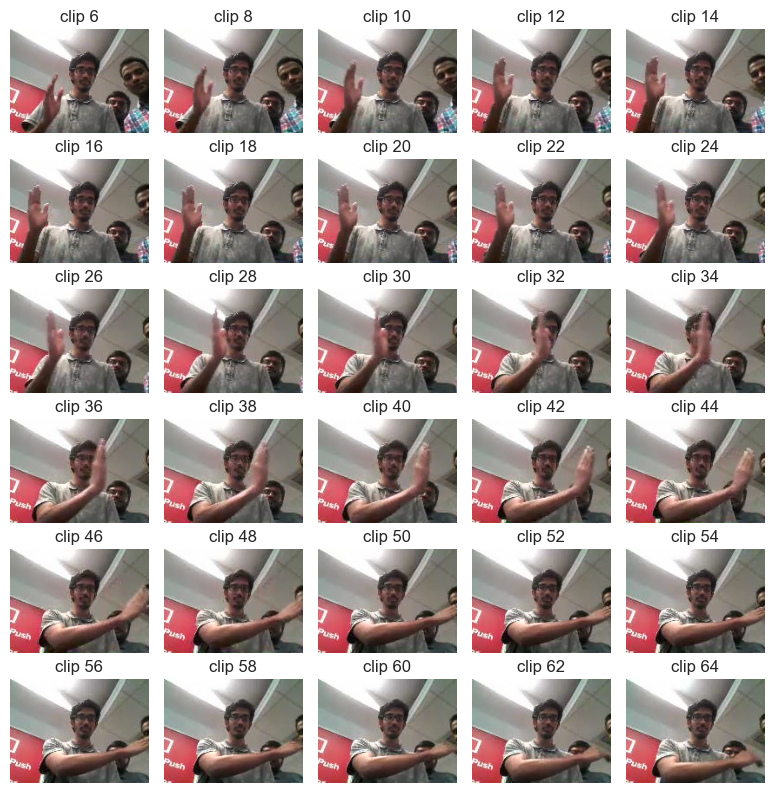

In [13]:
plot_clip_frames(idx = 0)

Sample clip WIN_20180925_17_20_55_Pro_Right_Swipe_new is a Right_Swipe_new gesture from train dataset


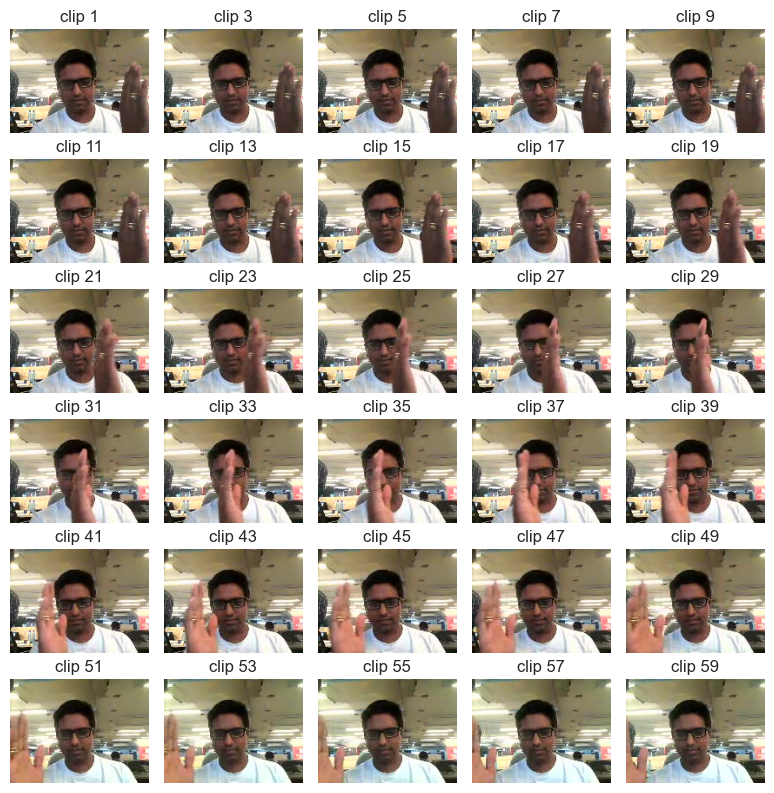

In [14]:
plot_clip_frames(idx = 100)

Sample clip WIN_20180925_17_29_33_Pro_Stop_new is a Stop_new gesture from train dataset


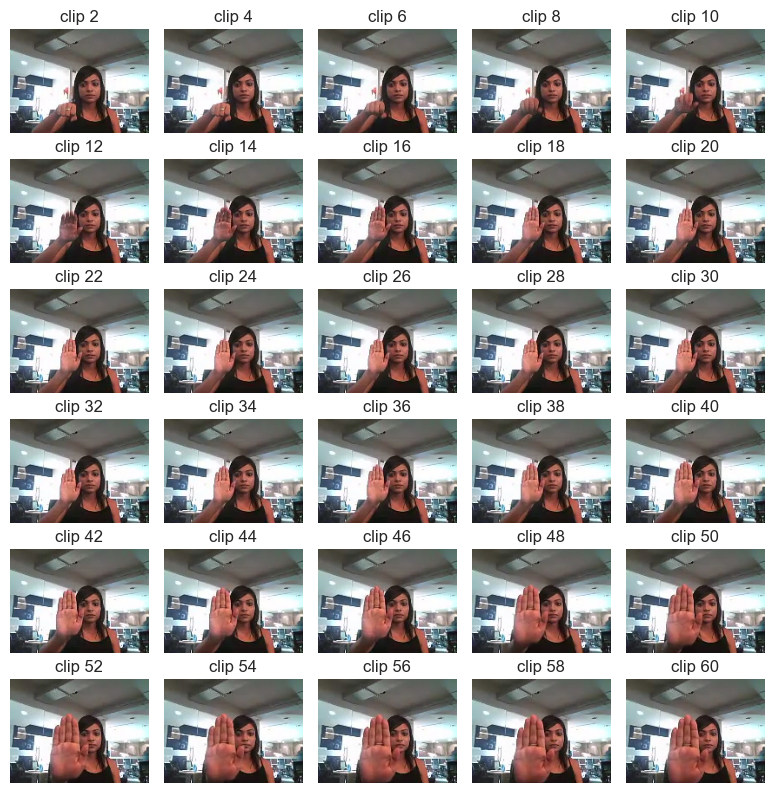

In [15]:
plot_clip_frames(idx = 200)

Sample clip WIN_20180925_17_26_37_Pro_Thumbs_Up_new is a Thumbs_Up_new gesture from train dataset


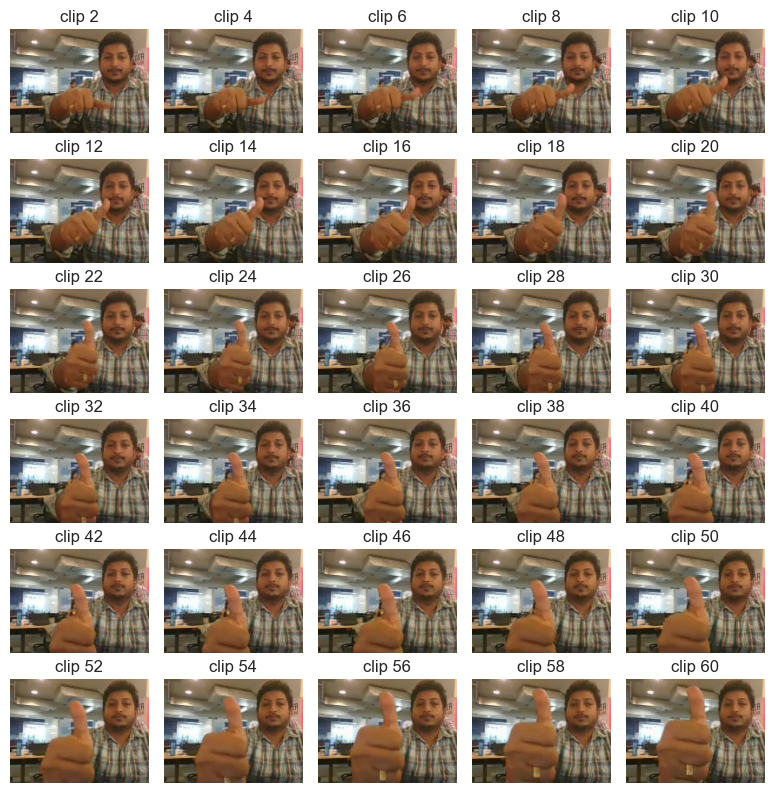

In [16]:
plot_clip_frames(idx = 400)

Sample clip WIN_20180926_17_32_40_Pro_Stop_new is a Stop_new gesture from val dataset


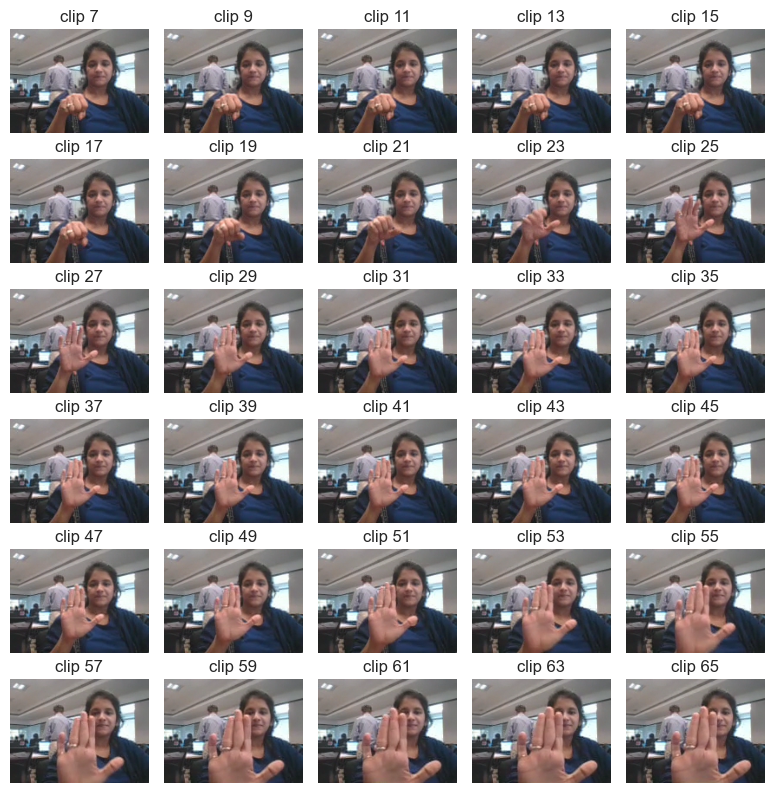

In [17]:
plot_clip_frames(idx = 700)

Gestures are fairly centered with varying backgrounds.

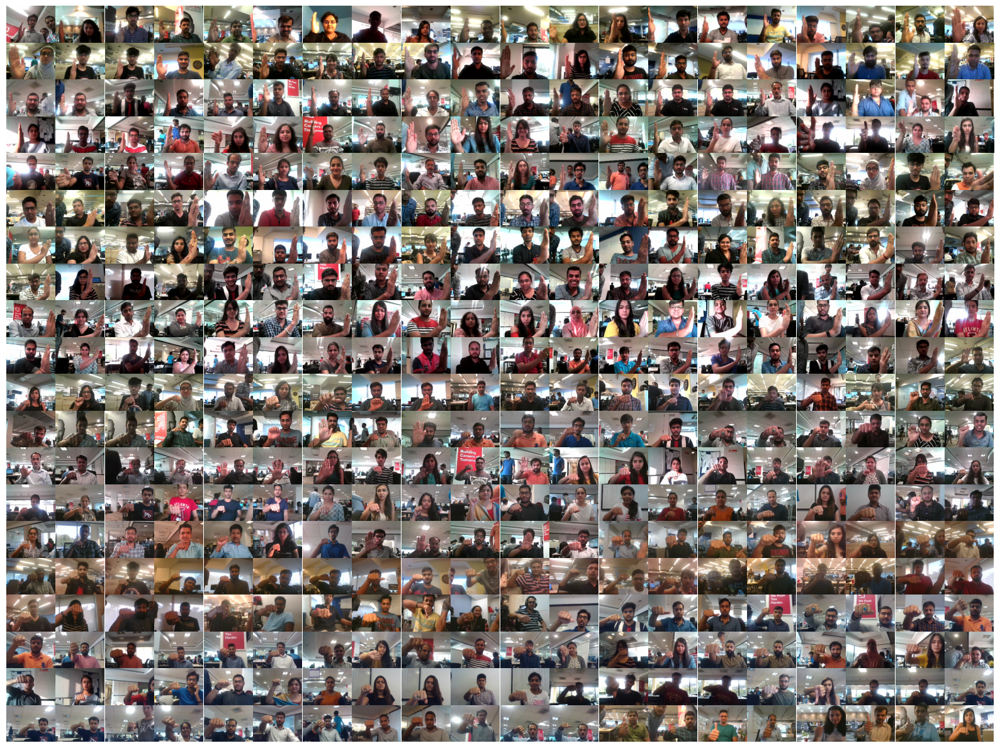

In [18]:
### Inspecting backgrounds by plotting first frame
fig, axes = plt.subplots(20, 20, figsize = (16, 12))
for idx, ax in enumerate(axes.flatten()):
    [clip_id, sub_folder, gesture] = df.loc[idx, ['clip_id', 'kind', 'gesture']].values
    clip_path = os.path.join(data_dir, sub_folder, clip_id)
    paths = sorted(os.listdir(clip_path))
    img = Image.open(os.path.join(clip_path, paths[0]))
    ax.imshow(img)
    ax.grid(visible=False)
    ax.axis('off')
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout(h_pad = 0, w_pad = 0)
plt.show()

In [21]:
## Save cleaned data into data/processed directory
df[df['kind'] == 'train'][['clip_id', 'gesture', 'label']].reset_index(drop = True)\
    .to_csv('../data/processed/train.csv', index = False)
    
df[df['kind'] == 'val'][['clip_id', 'gesture', 'label']].reset_index(drop = True)\
    .to_csv('../data/processed/val.csv', index = False)

### END